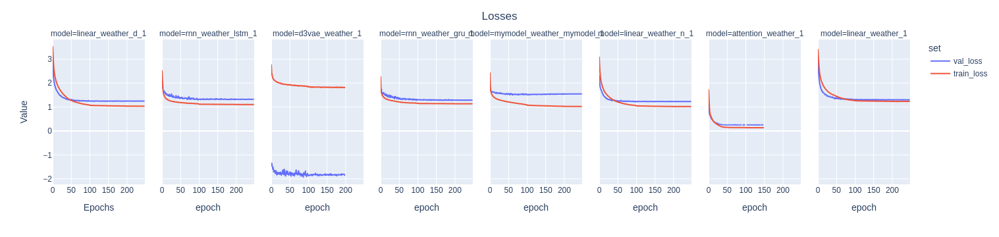

In [35]:
import plotly.express as px
import pandas as pd
tot_losses = pd.read_csv('/home/agobbi/Projects/ExpTS/csv/prova_test_LOSSES.csv')

fig_losses = px.line(tot_losses,x = 'epoch',y='loss',color = 'set',facet_col='model',width = 2600)
#fig_losses.update_traces(mode="markers+lines", hovertemplate=None)
#fig_losses.update_layout(hovermode="x unified")
fig_losses.update_layout(title = {'text':f'Losses', 'x':0.5},
                  xaxis_title={'text':'Epochs'},
                  yaxis_title={'text':'Value'},

                    )
    
fig_losses

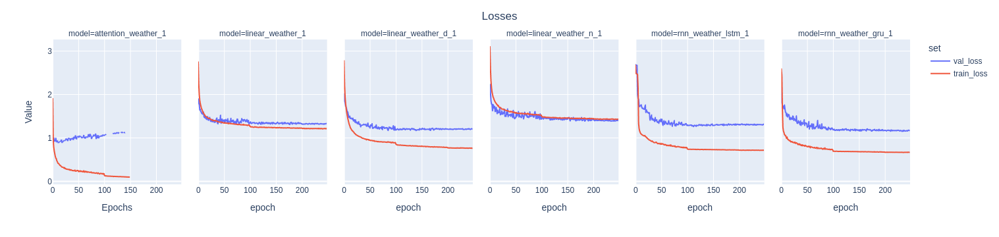

In [29]:
import plotly.express as px
import pandas as pd
tot_losses = pd.read_csv('/home/agobbi/Projects/ExpTSTraffic/csv/prova_test_LOSSES.csv')

fig_losses = px.line(tot_losses,x = 'epoch',y='loss',color = 'set',facet_col='model')
#fig_losses.update_traces(mode="markers+lines", hovertemplate=None)
#fig_losses.update_layout(hovermode="x unified")
fig_losses.update_layout(title = {'text':f'Losses', 'x':0.5},
                  xaxis_title={'text':'Epochs'},
                  yaxis_title={'text':'Value'},

                    )
    
fig_losses.show()

In [3]:
import plotly.express as px
import pandas as pd
tot_pred = pd.read_csv('/home/agobbi/Projects/ExpTS/csv/prova_test_tot_predictions.csv')
tot_pred.sort_values(by='time',inplace=True)
#tot_pred.y_median[tot_pred.model=='d3vae_weather_1'] = tot_pred.y_pred[tot_pred.model=='d3vae_weather_1']
#tot_pred.y_median[tot_pred.model=='persistent_weather_1'] = tot_pred.y_pred[tot_pred.model=='persistent_weather_1']

In [4]:
tot_pred.model.unique()

array(['linear_weather_d_1', 'linear_weather_n_1', 'attention_weather_1',
       'mymodel_weather_mymodel_1', 'persistent_weather_1',
       'linear_weather_1', 'rnn_weather_gru_1', 'rnn_weather_lstm_1'],
      dtype=object)

In [5]:
tot_pred.head()

,Unnamed: 0,lag,time,y,y_pred,model
0,0,1,2020-10-19 22:00:00,0.743537,0.090184,linear_weather_d_1
840720,840720,1,2020-10-19 22:00:00,0.743537,0.699701,linear_weather_n_1
1008864,1008864,1,2020-10-19 22:00:00,0.743537,0.717612,attention_weather_1
672576,672576,1,2020-10-19 22:00:00,0.743537,0.069393,mymodel_weather_mymodel_1
336288,336288,1,2020-10-19 22:00:00,0.743537,0.721537,persistent_weather_1


In [6]:
lag=1
fig = px.line(tot_pred[(tot_pred.lag==lag) & (tot_pred.model=='mymodel_weather_mymodel_1')], x='time', y='y_median', color='model',height=800)
fig.add_scatter(x = tot_pred[tot_pred.lag==lag].time, y=tot_pred[tot_pred.lag==lag].y)
fig.add_scatter(x =tot_pred[(tot_pred.lag==lag) & (tot_pred.model=='mymodel_weather_mymodel_1')].time, y=tot_pred[(tot_pred.lag==lag) & (tot_pred.model=='mymodel_weather_mymodel_1')].y_low)
fig.add_scatter(x =tot_pred[(tot_pred.lag==lag) & (tot_pred.model=='mymodel_weather_mymodel_1')].time, y=tot_pred[(tot_pred.lag==lag) & (tot_pred.model=='mymodel_weather_mymodel_1')].y_high)

ValueError: Value of 'y' is not the name of a column in 'data_frame'. Expected one of ['Unnamed: 0', 'lag', 'time', 'y', 'y_pred', 'model'] but received: y_median

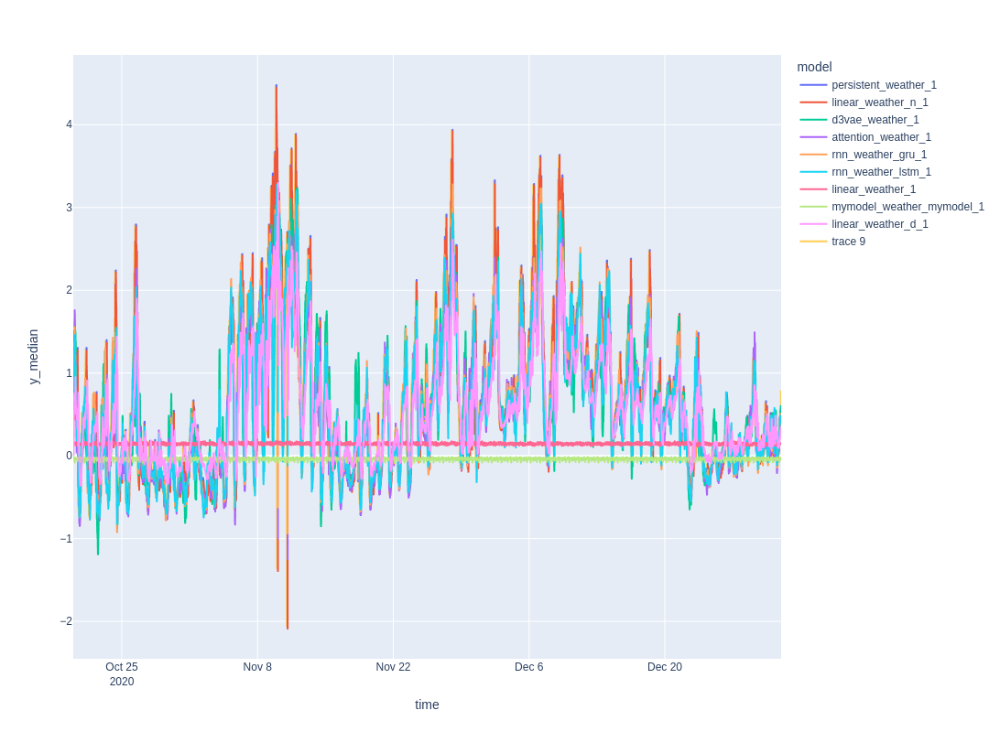

In [45]:
fig = px.line(tot_pred[tot_pred.lag==12], x='time', y='y_median', color='model',height=800)
fig.add_scatter(x = tot_pred[tot_pred.lag==16].time, y=tot_pred[tot_pred.lag==16].y)

In [46]:
import numpy as np
error = tot_pred.groupby(['lag','model']).apply(lambda x: np.nanmean((x.y-x.y_median)**2)).reset_index().rename(columns={0:'error'}) 


In [50]:
import numpy as np
error = tot_pred.groupby(['lag','model']).apply(lambda x: 100*np.nanmean(np.abs(x.y-x.y_median)/x.y)).reset_index().rename(columns={0:'error'}) 


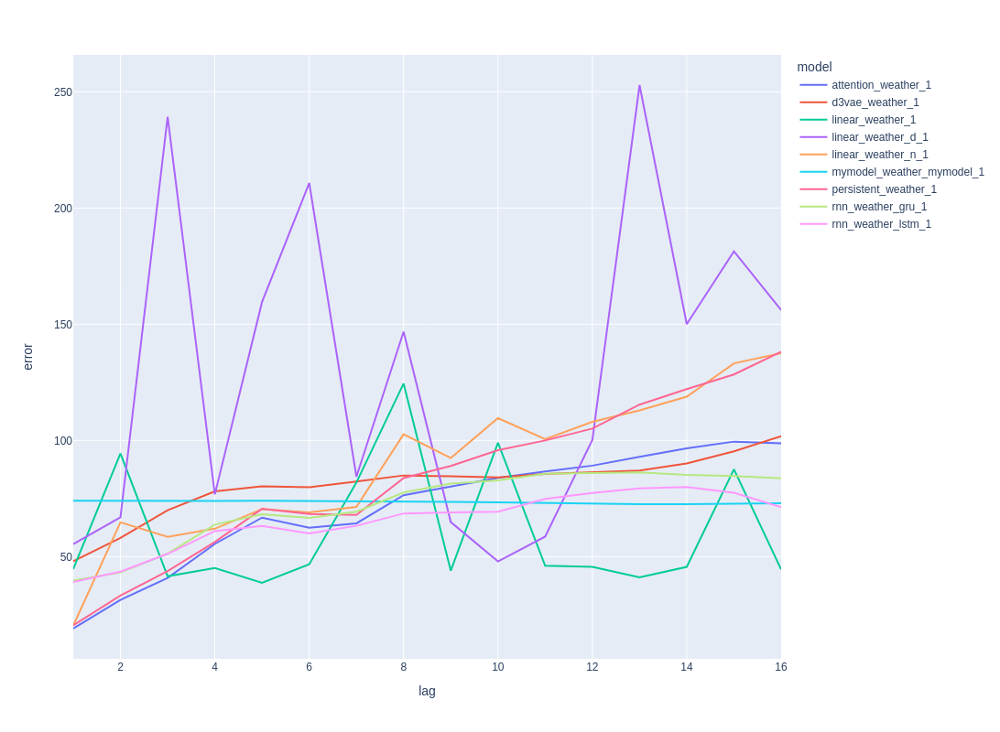

In [51]:
fig = px.line(error, x='lag', y='error', color='model',height=800)
fig.show()

In [34]:
error[error.model=='rnn_weather_gru_1']

,lag,model,error
5,1,rnn_weather_gru_1,0.406684
12,2,rnn_weather_gru_1,0.397108
19,3,rnn_weather_gru_1,0.386252
26,4,rnn_weather_gru_1,0.373913
33,5,rnn_weather_gru_1,0.362212
40,6,rnn_weather_gru_1,0.349343
47,7,rnn_weather_gru_1,0.335265
54,8,rnn_weather_gru_1,0.323539
61,9,rnn_weather_gru_1,0.316570
68,10,rnn_weather_gru_1,0.314499
